In [ ]:
#https://www.kaggle.com/datasets/saurabhshahane/seoul-bike-sharing-demand-prediction?datasetId=1182486&sortBy=voteCount

In [ ]:
!pip install opendatasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#to import the dataset
import opendatasets as od
from pathlib import Path

#for data handling
import pandas as pd
import numpy as np

#for visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

#for date time conversion
from datetime import datetime
import datetime as dt

#for data preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MultiLabelBinarizer

#for models
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

#for model calculations and model trainings
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [ ]:
#importing dataset
od.download("https://www.kaggle.com/saurabhshahane/seoul-bike-sharing-demand-prediction")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: 

In [ ]:
#reading the dataset and checking its first 5 lines
df_dir=Path("/content/seoul-bike-sharing-demand-prediction/SeoulBikeData.csv")
df=pd.read_csv(df_dir, encoding= 'unicode_escape')
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
#df consists of 8760 rows and 14 features
df.shape

(8760, 14)

In [ ]:
#the types of features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [ ]:
#number of unique values in each column
df.nunique()

Date                          365
Rented Bike Count            2166
Hour                           24
Temperature(°C)               546
Humidity(%)                    90
Wind speed (m/s)               65
Visibility (10m)             1789
Dew point temperature(°C)     556
Solar Radiation (MJ/m2)       345
Rainfall(mm)                   61
Snowfall (cm)                  51
Seasons                         4
Holiday                         2
Functioning Day                 2
dtype: int64

In [ ]:
#count, mean, standard deviation, min-max values of features
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Rented Bike Count,8760.0,704.602055,644.997468,0.0,191.00,504.50,1065.25,3556.00
Hour,8760.0,11.500000,6.922582,0.0,5.75,11.50,17.25,23.00
Temperature(°C),8760.0,12.882922,11.944825,-17.8,3.50,13.70,22.50,39.40
Humidity(%),8760.0,58.226256,20.362413,0.0,42.00,57.00,74.00,98.00
Wind speed (m/s),8760.0,1.724909,1.036300,0.0,0.90,1.50,2.30,7.40
Visibility (10m),8760.0,1436.825799,608.298712,27.0,940.00,1698.00,2000.00,2000.00
Dew point temperature(°C),8760.0,4.073813,13.060369,-30.6,-4.70,5.10,14.80,27.20
Solar Radiation (MJ/m2),8760.0,0.569111,0.868746,0.0,0.00,0.01,0.93,3.52
Rainfall(mm),8760.0,0.148687,1.128193,0.0,0.00,0.00,0.00,35.00
Snowfall (cm),8760.0,0.075068,0.436746,0.0,0.00,0.00,0.00,8.80


In [ ]:
#total number of null values in the dataset, which is 0
df.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

In [ ]:
#total number of duplicated values in the dataset, which is 0
len(df[df.duplicated()])

0

In [ ]:
#changing column names into nonblank names to proceed easily
df=df.rename(columns={'Rented Bike Count':'Rented_Bike_Count',
                      'Temperature(°C)':'Temperature',
                      'Humidity(%)':'Humidity',
                      'Wind speed (m/s)':'Wind_speed',
                      'Visibility (10m)':'Visibility',
                      'Dew point temperature(°C)':'Dew_point_temperature',
                      'Solar Radiation (MJ/m2)':'Solar_Radiation',
                      'Rainfall(mm)':'Rainfall',
                      'Snowfall (cm)':'Snowfall',
                      'Functioning Day':'Functioning_Day'})

In [ ]:
#creating year, month, and day columns from the Date column
df['Date'] = df['Date'].apply(lambda x: dt.datetime.strptime(x,"%d/%m/%Y"))
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month
df['day'] = df['Date'].dt.day_name()

In [ ]:
#creating a column to show if a day is weekday or weekend (weekdays_weekend) and dropping the columns Date, day, year
#we did this because bike usage is more dependent on the weekday or weekend and months rather than days or years
df['weekdays_weekend']=df['day'].apply(lambda x : 1 if x=='Saturday' or x=='Sunday' else 0 )
df=df.drop(columns=['Date','day','year'],axis=1)

In [ ]:
#showing how many weekdays and how many weekend days exist in our dataset 
df['weekdays_weekend'].value_counts()

0    6264
1    2496
Name: weekdays_weekend, dtype: int64

In [ ]:
#showing the first 5 lines of the dataset
df.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,month,weekdays_weekend
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0


In [ ]:
#showing data types of features in the dataset after changes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Rented_Bike_Count      8760 non-null   int64  
 1   Hour                   8760 non-null   int64  
 2   Temperature            8760 non-null   float64
 3   Humidity               8760 non-null   int64  
 4   Wind_speed             8760 non-null   float64
 5   Visibility             8760 non-null   int64  
 6   Dew_point_temperature  8760 non-null   float64
 7   Solar_Radiation        8760 non-null   float64
 8   Rainfall               8760 non-null   float64
 9   Snowfall               8760 non-null   float64
 10  Seasons                8760 non-null   object 
 11  Holiday                8760 non-null   object 
 12  Functioning_Day        8760 non-null   object 
 13  month                  8760 non-null   int64  
 14  weekdays_weekend       8760 non-null   int64  
dtypes: f

In [ ]:
#since hour, month, and weekdays_weekend represents categorical values we changed their types into category type
cols=['Hour','month','weekdays_weekend']
for col in cols:
  df[col]=df[col].astype('category')
#showing data types of features in the dataset after changes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Rented_Bike_Count      8760 non-null   int64   
 1   Hour                   8760 non-null   category
 2   Temperature            8760 non-null   float64 
 3   Humidity               8760 non-null   int64   
 4   Wind_speed             8760 non-null   float64 
 5   Visibility             8760 non-null   int64   
 6   Dew_point_temperature  8760 non-null   float64 
 7   Solar_Radiation        8760 non-null   float64 
 8   Rainfall               8760 non-null   float64 
 9   Snowfall               8760 non-null   float64 
 10  Seasons                8760 non-null   object  
 11  Holiday                8760 non-null   object  
 12  Functioning_Day        8760 non-null   object  
 13  month                  8760 non-null   category
 14  weekdays_weekend       8760 non-null   c

In [ ]:
#to report features of the columns and their relationships with each other
#we used pandas profiling 
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
import pandas_profiling as pdpf

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [ ]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<BarContainer object of 12 artists>

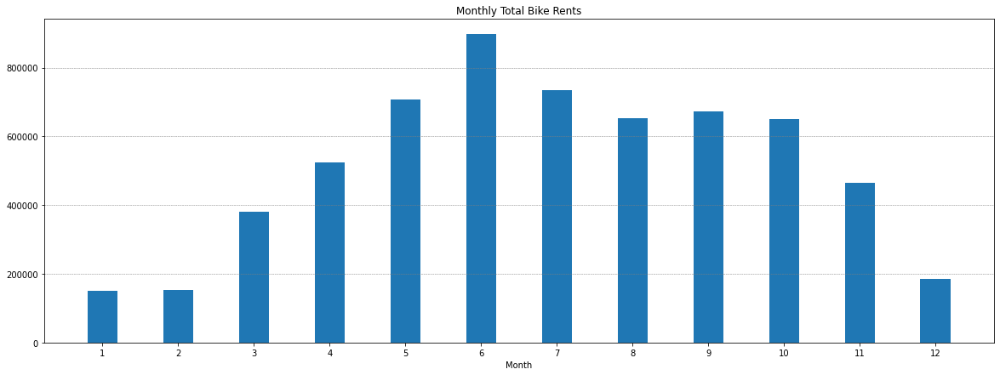

In [ ]:
#monthly total bike rents
fig = plt.figure(figsize = (20, 7))
values=df["month"].unique()
counts=[]
for i in range(len(values)):
  counts.append(df[df["month"]==values[i]]["Rented_Bike_Count"].sum())
plt.xticks(values)
plt.xlabel("Month")
plt.title("Monthly Total Bike Rents")
plt.grid(axis="y", color = 'gray', linestyle = '--', linewidth = 0.5)
plt.bar(values, counts, width = 0.4)

[Text(0.5, 1.0, 'Monthly Distribution of Rented Bikes')]

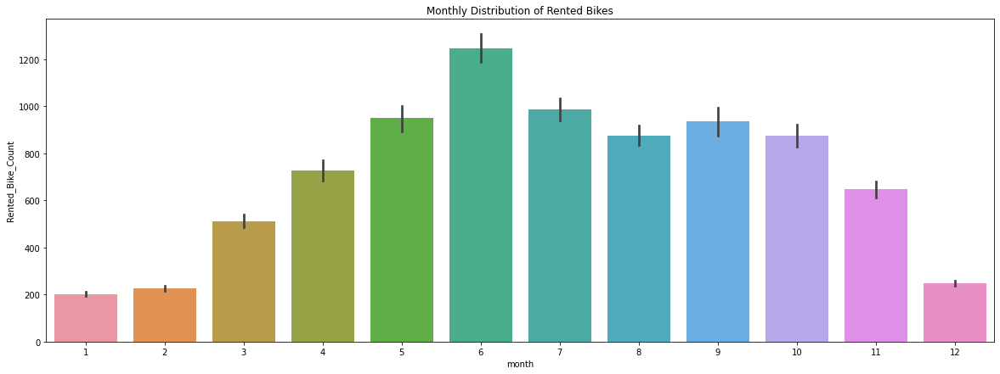

In [ ]:
#monthly bike rents distribution
fig,ax=plt.subplots(figsize=(20,7))
sns.barplot(data=df,x='month',y='Rented_Bike_Count',ax=ax)
ax.set(title='Monthly Distribution of Rented Bikes')

<BarContainer object of 2 artists>

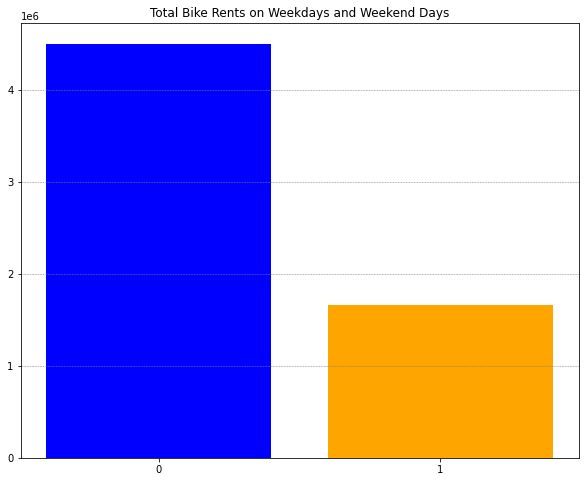

In [ ]:
#total bike rents on weekdays and weekend days
fig = plt.figure(figsize = (10, 8))
values=df["weekdays_weekend"].unique()
counts=[]
for i in range(len(values)):
  counts.append(df[df["weekdays_weekend"]==values[i]]["Rented_Bike_Count"].sum())
plt.xticks(values)
plt.title("Total Bike Rents on Weekdays and Weekend Days")
plt.grid(axis="y", color = 'gray', linestyle = '--', linewidth = 0.5)
plt.bar(values, counts, color=["blue", "orange"])

In [ ]:
df[df["weekdays_weekend"]==1]["Rented_Bike_Count"].sum()/len(df[df["weekdays_weekend"]==1])

667.3421474358975

In [ ]:
df[df["weekdays_weekend"]==0]["Rented_Bike_Count"].sum()/len(df[df["weekdays_weekend"]==0])

719.4489144316731

[Text(0.5, 1.0, 'Rented Bike Count Distribution Between Weekdays and Weekend Days')]

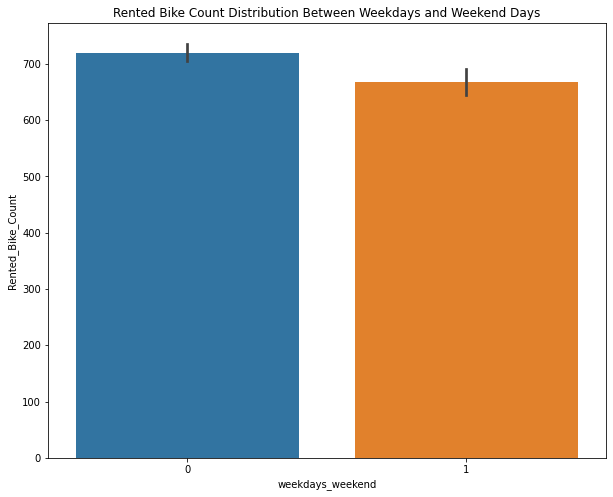

In [ ]:
#rented bike count distribution between weekdays and weekend days
fig,ax=plt.subplots(figsize=(10,8))
sns.barplot(data=df,x='weekdays_weekend',y='Rented_Bike_Count',ax=ax)
ax.set(title="Rented Bike Count Distribution Between Weekdays and Weekend Days")

<BarContainer object of 24 artists>

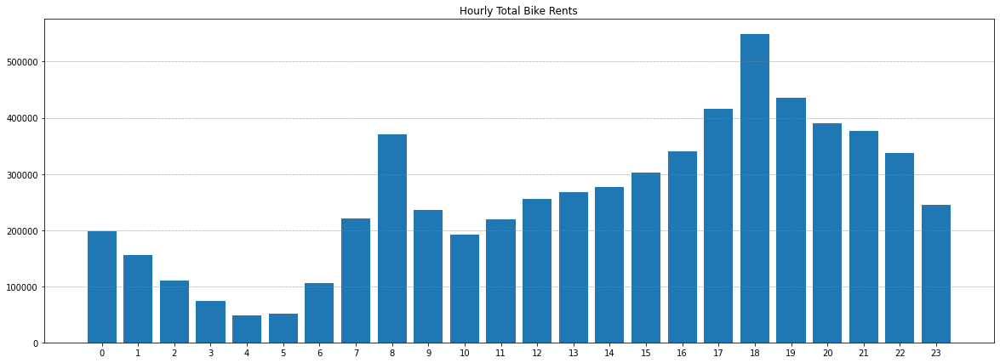

In [ ]:
#hourly total bike rents
fig = plt.figure(figsize = (20, 7))
values=df["Hour"].unique()
counts=[]
for i in range(len(values)):
  counts.append(df[df["Hour"]==values[i]]["Rented_Bike_Count"].sum())
plt.xticks(values)
plt.title("Hourly Total Bike Rents")
plt.grid(axis="y", color = 'gray', linestyle = '--', linewidth = 0.5)
plt.bar(values, counts)

[Text(0.5, 1.0, 'Hourly Rented Bike Count Distribution')]

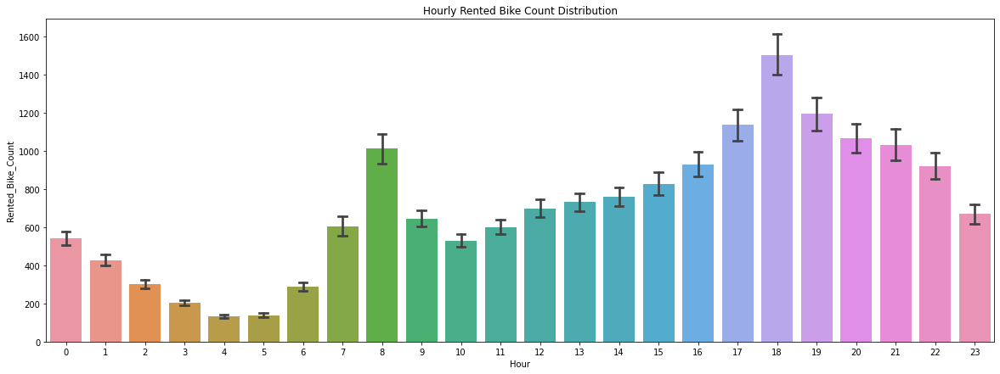

In [ ]:
#hourly rented bike count distribution
fig,ax=plt.subplots(figsize=(20,7))
sns.barplot(data=df,x='Hour',y='Rented_Bike_Count',ax=ax,capsize=.2)
ax.set(title="Hourly Rented Bike Count Distribution")

[Text(0.5, 1.0, 'Hourly Rented Bike Count Distribution for Weekdays and Weekend Days')]

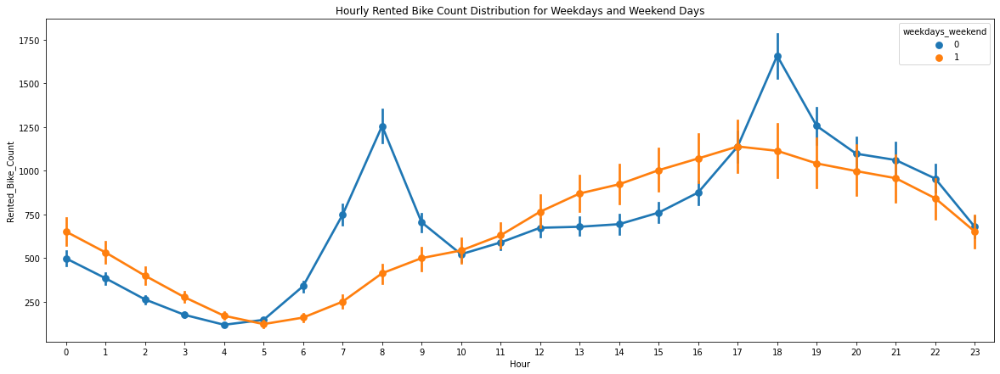

In [ ]:
#hourly rented bike count distribution on weekdays and weekend days
fig,ax=plt.subplots(figsize=(20,7))
sns.pointplot(data=df,x='Hour',y='Rented_Bike_Count',hue='weekdays_weekend',ax=ax)
ax.set(title="Hourly Rented Bike Count Distribution for Weekdays and Weekend Days")

Text(0.5, 1.0, 'Total Count Distribution')

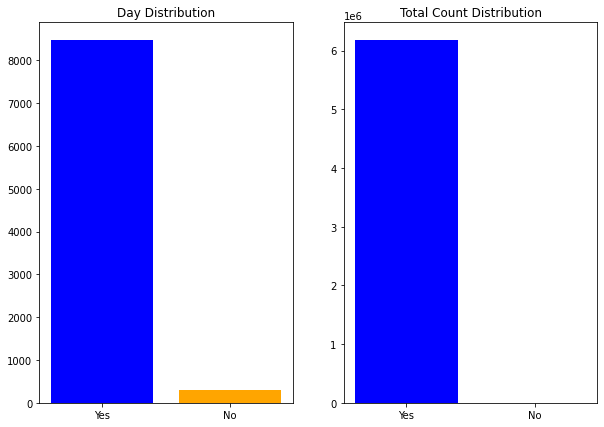

In [ ]:
#total bike rents on functioning days and non_functioning days
fig,(ax1,ax2) = plt.subplots(1,2, figsize=(10,7))
values=df["Functioning_Day"].unique()
counts1=[len(df[df["Functioning_Day"]==values[0]]), len(df[df["Functioning_Day"]==values[1]])]
ax1.bar(values, counts1, color=["blue", "orange"])
ax1.set_title("Day Distribution")

counts2=[]
for i in range(len(values)):
  counts2.append(df[df["Functioning_Day"]==values[i]]["Rented_Bike_Count"].sum())
ax2.bar(values, counts2, color=["blue", "orange"])
ax2.set_title("Total Count Distribution")

[Text(0.5, 1.0, 'Rented Bike Count Distribution Between Functioning and Non-functioning Days')]

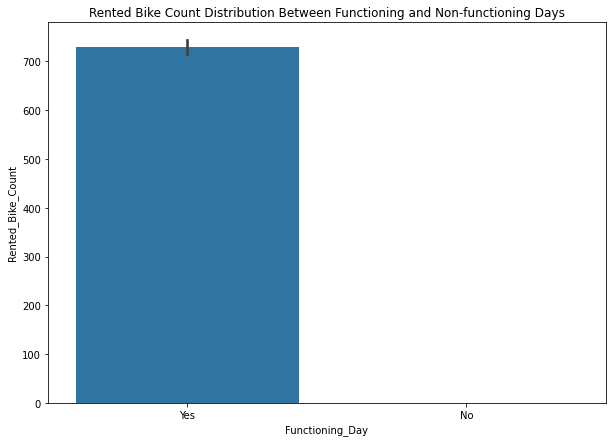

In [ ]:
#rented bike count distribution between functioning and non-functioning days
fig,ax=plt.subplots(figsize=(10,7))
sns.barplot(data=df,x='Functioning_Day',y='Rented_Bike_Count',ax=ax)
ax.set(title="Rented Bike Count Distribution Between Functioning and Non-functioning Days")

<BarContainer object of 4 artists>

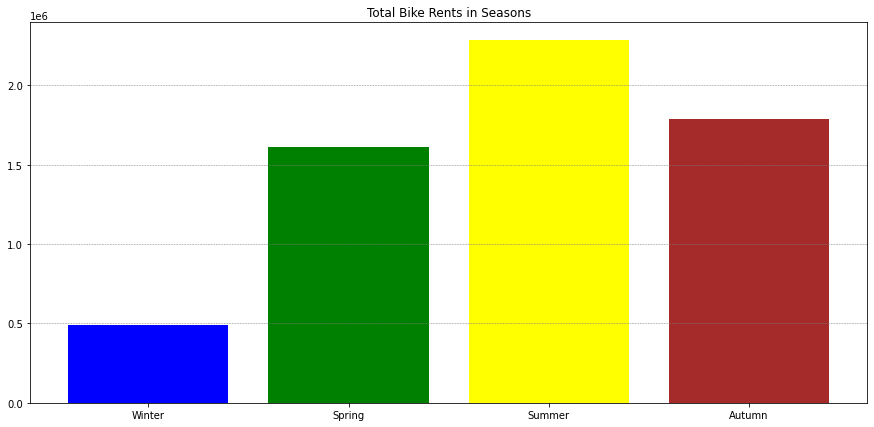

In [ ]:
#total bike rents in seasons
fig = plt.figure(figsize = (15, 7))
values=df["Seasons"].unique()
counts=[]
for i in range(len(values)):
  counts.append(df[df["Seasons"]==values[i]]["Rented_Bike_Count"].sum())
plt.title("Total Bike Rents in Seasons")
plt.grid(axis="y", color = 'gray', linestyle = '--', linewidth = 0.5)
plt.bar(values, counts, color=["blue", "green", "yellow", "brown"])

[Text(0.5, 1.0, 'Rented Bike Distribution According to Seasons')]

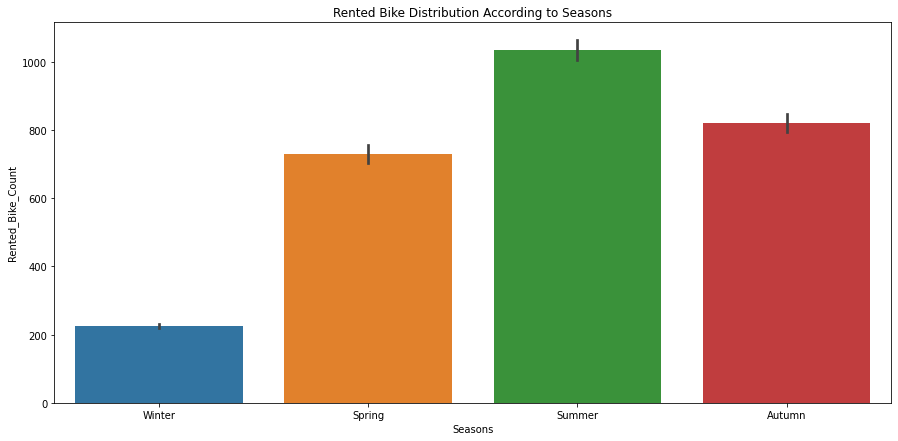

In [ ]:
#rented bike distribution according to seasons
fig,ax=plt.subplots(figsize=(15,7))
sns.barplot(data=df,x='Seasons',y='Rented_Bike_Count',ax=ax)
ax.set(title='Rented Bike Distribution According to Seasons')

[Text(0.5, 1.0, 'Distribution of Rented Bikes on Hourly Basis in Seasons')]

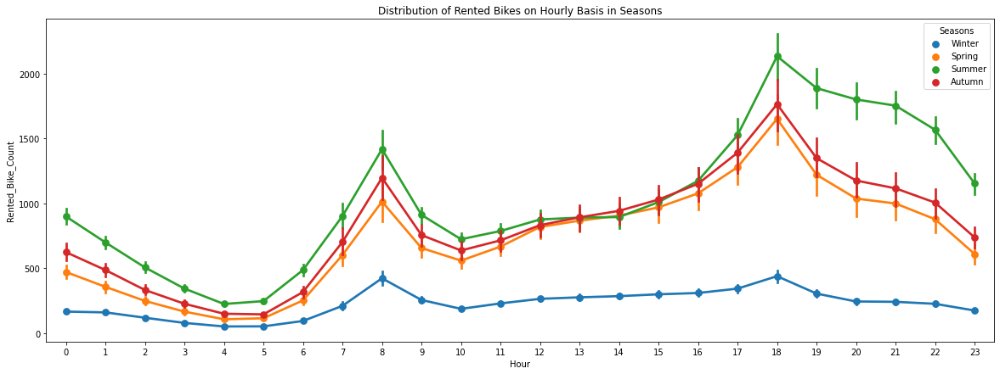

In [ ]:
#distribution of rented bikes on hourly basis in seasons
fig,ax=plt.subplots(figsize=(20,7))
sns.pointplot(data=df,x='Hour',y='Rented_Bike_Count',hue='Seasons',ax=ax)
ax.set(title='Distribution of Rented Bikes on Hourly Basis in Seasons')

Text(0.5, 1.0, 'Total Count Distribution')

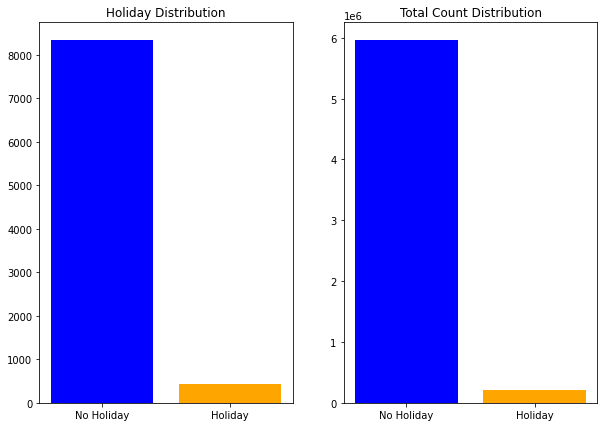

In [ ]:
#total bike rents on holidays and normal days
fig,(ax1,ax2) = plt.subplots(1,2, figsize=(10,7))
values=df["Holiday"].unique()
counts1=[len(df[df["Holiday"]==values[0]]), len(df[df["Holiday"]==values[1]])]
ax1.bar(values, counts1, color=["blue", "orange"])
ax1.set_title("Holiday Distribution")

counts2=[]
for i in range(len(values)):
  counts2.append(df[df["Holiday"]==values[i]]["Rented_Bike_Count"].sum())
ax2.bar(values, counts2, color=["blue", "orange"])
ax2.set_title("Total Count Distribution")

[Text(0.5, 1.0, 'Count of Rented bikes acording to Holiday ')]

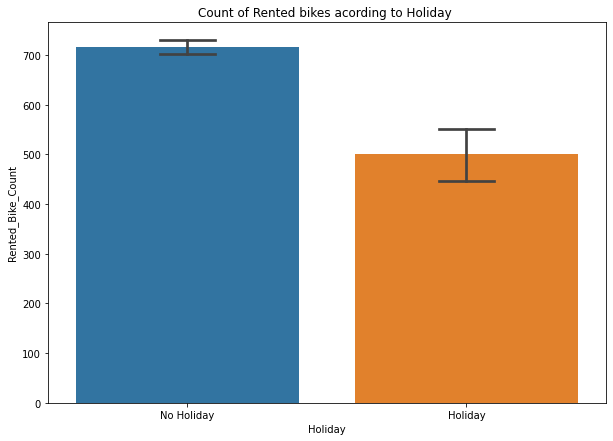

In [ ]:
#rented bike distribution according to holiday
fig,ax=plt.subplots(figsize=(10,7))
sns.barplot(data=df,x='Holiday',y='Rented_Bike_Count',ax=ax,capsize=.2)
ax.set(title='Count of Rented bikes acording to Holiday ')

[Text(0.5, 1.0, 'Count of Rented bikes acording to Holiday ')]

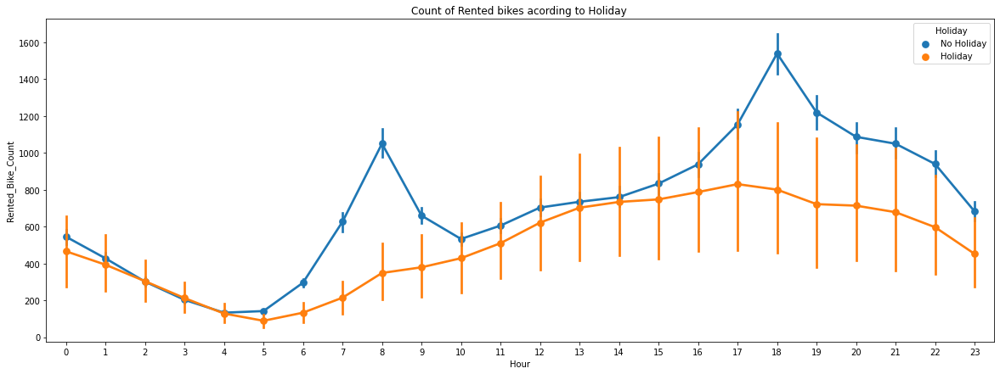

In [ ]:
#distribution of rented bikes on hourly basis on holidays and normal days
fig,ax=plt.subplots(figsize=(20,7))
sns.pointplot(data=df,x='Hour',y='Rented_Bike_Count',hue='Holiday',ax=ax)
ax.set(title='Count of Rented bikes acording to Holiday ')

In [ ]:
#getting numerical columns as indexes for visualization
numerical_columns=list(df.select_dtypes(['int64','float64']).columns)
numerical_features=pd.Index(numerical_columns)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

[Text(0.5, 0, 'Snowfall')]

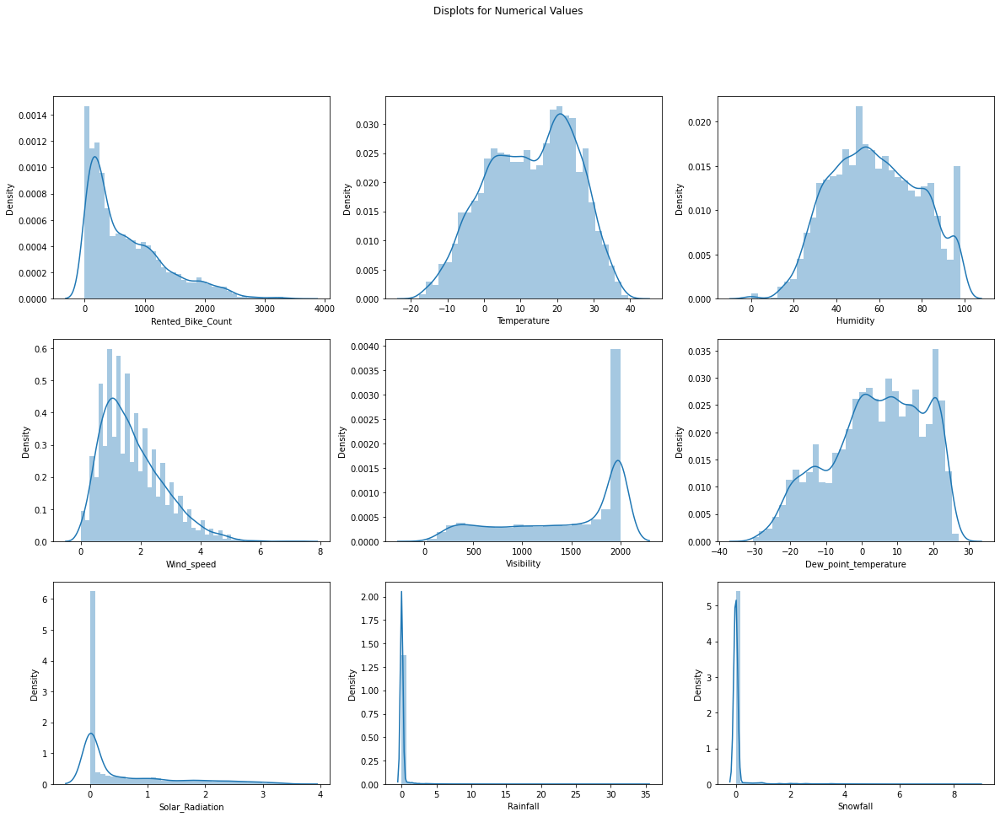

In [ ]:
#density visualizations of numerical features
fig, axes=plt.subplots(3,3,figsize=(20,15))
fig.suptitle("Displots for Numerical Values")

sns.distplot(ax=axes[0,0], x=df[numerical_features[0]])
axes[0,0].set(xlabel=numerical_features[0])

sns.distplot(ax=axes[0,1], x=df[numerical_features[1]])
axes[0,1].set(xlabel=numerical_features[1])

sns.distplot(ax=axes[0,2], x=df[numerical_features[2]])
axes[0,2].set(xlabel=numerical_features[2])

sns.distplot(ax=axes[1,0], x=df[numerical_features[3]])
axes[1,0].set(xlabel=numerical_features[3])

sns.distplot(ax=axes[1,1], x=df[numerical_features[4]])
axes[1,1].set(xlabel=numerical_features[4])

sns.distplot(ax=axes[1,2], x=df[numerical_features[5]])
axes[1,2].set(xlabel=numerical_features[5])

sns.distplot(ax=axes[2,0], x=df[numerical_features[6]])
axes[2,0].set(xlabel=numerical_features[6])

sns.distplot(ax=axes[2,1], x=df[numerical_features[7]])
axes[2,1].set(xlabel=numerical_features[7])

sns.distplot(ax=axes[2,2], x=df[numerical_features[8]])
axes[2,2].set(xlabel=numerical_features[8])

Text(0.5, 1.0, 'Snowfall')

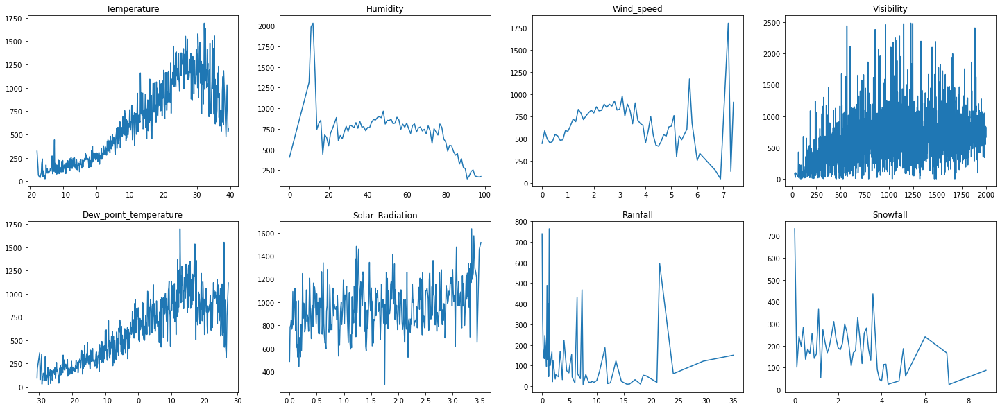

In [ ]:
#rented bikes distribution of numerical features
fig,axes = plt.subplots(2,4, figsize=(25,10))
axes[0,0].plot(df.groupby('Temperature').mean()['Rented_Bike_Count'])
axes[0,0].set_title("Temperature")

axes[0,1].plot(df.groupby('Humidity').mean()['Rented_Bike_Count'])
axes[0,1].set_title("Humidity")

axes[0,2].plot(df.groupby('Wind_speed').mean()['Rented_Bike_Count'])
axes[0,2].set_title("Wind_speed")

axes[0,3].plot(df.groupby('Visibility').mean()['Rented_Bike_Count'])
axes[0,3].set_title("Visibility")

axes[1,0].plot(df.groupby('Dew_point_temperature').mean()['Rented_Bike_Count'])
axes[1,0].set_title("Dew_point_temperature")

axes[1,1].plot(df.groupby('Solar_Radiation').mean()['Rented_Bike_Count'])
axes[1,1].set_title("Solar_Radiation")

axes[1,2].plot(df.groupby('Rainfall').mean()['Rented_Bike_Count'])
axes[1,2].set_title("Rainfall")

axes[1,3].plot(df.groupby('Snowfall').mean()['Rented_Bike_Count'])
axes[1,3].set_title("Snowfall")

In [ ]:
#getting categorical features as indexes for one hot encoding (making them numerical)
categorical_features=list(df.select_dtypes(['object','category']).columns)
categorical_features=pd.Index(categorical_features)
len(categorical_features)

6

In [ ]:
#applying one hot encoding for categorical features
def one_hot_encoding(data, column):
    data = pd.concat([data, pd.get_dummies(data[column], prefix=column, drop_first=True)], axis=1)
    data = data.drop([column], axis=1)
    return data

for feature in categorical_features:
    df = one_hot_encoding(df, feature)
df.head()

,Rented_Bike_Count,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Hour_1,...,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,weekdays_weekend_1
0,254,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,1,0
1,204,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,1,...,0,0,0,0,0,0,0,0,1,0
2,173,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,1,0
3,107,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,1,0
4,78,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,1,0


In [ ]:
#showing all the columns of the dataset
df.describe().columns

Index(['Rented_Bike_Count', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6',
       'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12',
       'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18',
       'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23', 'Seasons_Spring',
       'Seasons_Summer', 'Seasons_Winter', 'Holiday_No Holiday',
       'Functioning_Day_Yes', 'month_2', 'month_3', 'month_4', 'month_5',
       'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11',
       'month_12', 'weekdays_weekend_1'],
      dtype='object')

In [ ]:
#assigning X and y
df_copy=df
X = df.drop(columns=['Rented_Bike_Count'], axis=1)
y = np.sqrt(df_copy['Rented_Bike_Count'])

In [ ]:
#the dimensions for the model
X.head()

,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Hour_1,Hour_2,...,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,weekdays_weekend_1
0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,1,0,...,0,0,0,0,0,0,0,0,1,0
2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,1,0
3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [ ]:
#the output of the model
y.head()

0    15.937377
1    14.282857
2    13.152946
3    10.344080
4     8.831761
Name: Rented_Bike_Count, dtype: float64

In [ ]:
#creating train and test data
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0)
print(X_train.shape)
print(X_test.shape)

(7008, 48)
(1752, 48)


In [ ]:
metrics=pd.DataFrame()

In [ ]:
#linear regression 
#model training
linear_regression=LinearRegression().fit(X_train, y_train)

#model prediction
linear_regression_y_pred=linear_regression.predict(X_test)

#evaluation metrics
#mean squared error
linear_regression_mse=mean_squared_error(y_test, linear_regression_y_pred)
print(linear_regression_mse)

#root mean square error
linear_regression_rmse=np.sqrt(linear_regression_mse)
print(linear_regression_rmse)

#mean absolute error
linear_regression_mae=mean_absolute_error(y_test, linear_regression_y_pred)
print(linear_regression_mae)

#r2 score
linear_regression_r2=r2_score(y_test, linear_regression_y_pred)
print(linear_regression_r2)

#storing values in a df
metrics_dict={"Model":"Linear regression",
              "MAE":linear_regression_mae,
              "MSE":linear_regression_mse,
              "RMSE":linear_regression_rmse,
              "R2":linear_regression_r2}

metrics = metrics.append(metrics_dict, ignore_index=True)

33.788208155457944
5.812762523573275
4.407854959720877
0.7854529737322447


In [ ]:
#decision tree regressor
#model training
decision_tree_regressor = DecisionTreeRegressor(criterion='mse', max_depth=8, max_features=9, max_leaf_nodes=100)
decision_tree_regressor.fit(X_train, y_train)

#model prediction
decision_tree_regressor_y_pred= decision_tree_regressor.predict(X_test)

#evaluation metrics
#mean squared error
decision_tree_regressor_mse=mean_squared_error(y_test, decision_tree_regressor_y_pred)
print(decision_tree_regressor_mse)

#root mean square error
decision_tree_regressor_rmse=np.sqrt(decision_tree_regressor_mse)
print(decision_tree_regressor_rmse)

#mean absolute error
decision_tree_regressor_mae=mean_absolute_error(y_test, decision_tree_regressor_y_pred)
print(decision_tree_regressor_mae)

#r2 score
decision_tree_regressor_r2=r2_score(y_test, decision_tree_regressor_y_pred)
print(decision_tree_regressor_r2)

#storing values in a df
metrics_dict={"Model":"Decision tree regressor",
              "MAE":decision_tree_regressor_mae,
              "MSE":decision_tree_regressor_mse,
              "RMSE":decision_tree_regressor_rmse,
              "R2":decision_tree_regressor_r2}

metrics = metrics.append(metrics_dict, ignore_index=True)

63.73982212138135
7.983722322412106
5.662665926106411
0.5952674013354257


/usr/local/lib/python3.7/dist-packages/sklearn/tree/_classes.py:363: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


In [ ]:
#random forest regressor
#model training
random_forest_regressor = RandomForestRegressor()
random_forest_regressor.fit(X_train,y_train)

#model prediction
random_forest_regressor_y_pred=random_forest_regressor.predict(X_test)

#evaluation metrics
#mean squared error
random_forest_regressor_mse=mean_squared_error(y_test, random_forest_regressor_y_pred)
print(random_forest_regressor_mse)

#root mean square error
random_forest_regressor_rmse=np.sqrt(random_forest_regressor_mse)
print(random_forest_regressor_rmse)

#mean absolute error
random_forest_regressor_mae=mean_absolute_error(y_test, random_forest_regressor_y_pred)
print(random_forest_regressor_mae)

#r2 score
random_forest_regressor_r2=r2_score(y_test, random_forest_regressor_y_pred)
print(random_forest_regressor_r2)

#storing values in a df
metrics_dict={"Model":"Random Forest regressor",
              "MAE":random_forest_regressor_mae,
              "MSE":random_forest_regressor_mse,
              "RMSE":random_forest_regressor_rmse,
              "R2":random_forest_regressor_r2}

metrics = metrics.append(metrics_dict, ignore_index=True)

13.005860750709768
3.606363923775548
2.2282638786184914
0.9174159003851597


In [ ]:
#gradient boosting
#model training
gradient_boosting=GradientBoostingRegressor()
gradient_boosting.fit(X_train,y_train)

#model prediction
gradient_boosting_y_pred=gradient_boosting.predict(X_test)

#evaluation metrics
#mean squared error
gradient_boosting_mse=mean_squared_error(y_test, gradient_boosting_y_pred)
print(gradient_boosting_mse)

#root mean square error
gradient_boosting_rmse=np.sqrt(gradient_boosting_mse)
print(gradient_boosting_rmse)

#mean absolute error
gradient_boosting_mae=mean_absolute_error(y_test, gradient_boosting_y_pred)
print(gradient_boosting_mae)

#r2 score
gradient_boosting_r2=r2_score(y_test, gradient_boosting_y_pred)
print(gradient_boosting_r2)

#storing values in a df
metrics_dict={"Model":"Gradient Boosting",
              "MAE":gradient_boosting_mae,
              "MSE":gradient_boosting_mse,
              "RMSE":gradient_boosting_rmse,
              "R2":gradient_boosting_r2}

metrics = metrics.append(metrics_dict, ignore_index=True)

21.11696075238546
4.595319439645677
3.4511143249197125
0.8659123587616067


In [ ]:
#gradient boosting with grid Search CV
#model parameters
n_estimators = [50,80,100] #number of trees
max_depth = [4,6,8] #maximum depth of trees
min_samples_split = [50,100,150] #minimum number of samples required to split a node
min_samples_leaf = [40,50] #minimum number of samples required at each leaf node
parameters_dict = {'n_estimators' : n_estimators,
                  'max_depth' : max_depth,
                  'min_samples_split' : min_samples_split,
                  'min_samples_leaf' : min_samples_leaf}

#model training
gradient_boosting=GradientBoostingRegressor()
grid_search_cv=GridSearchCV(estimator=gradient_boosting, param_grid=parameters_dict, cv=5, verbose=2)
grid_search_cv.fit(X_train,y_train)

#choosing the best estimator
grid_search_best=grid_search_cv.best_estimator_

#model prediction
grid_search_cv_y_pred=grid_search_best.predict(X_test)

#evaluation metrics
#mean squared error
grid_search_cv_mse=mean_squared_error(y_test, grid_search_cv_y_pred)
print(grid_search_cv_mse)

#root mean square error
grid_search_cv_rmse=np.sqrt(grid_search_cv_mse)
print(grid_search_cv_rmse)

#mean absolute error
grid_search_cv_mae=mean_absolute_error(y_test, grid_search_cv_y_pred)
print(grid_search_cv_mae)

#r2 score
grid_search_cv_r2=r2_score(y_test, grid_search_cv_y_pred)
print(grid_search_cv_r2)

#storing values in a df
metrics_dict={"Model":"Grid Search CV",
              "MAE":grid_search_cv_mae,
              "MSE":grid_search_cv_mse,
              "RMSE":grid_search_cv_rmse,
              "R2":grid_search_cv_r2}

metrics = metrics.append(metrics_dict, ignore_index=True)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.3s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.3s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.2s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   1.8s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   1.5s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   1.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   1.1s
[CV] END max_depth=4, min_sam

In [ ]:
metrics

,Model,MAE,MSE,RMSE,R2
0,Linear regression,4.407855,33.788208,5.812763,0.785453
1,Decision tree regressor,5.662666,63.739822,7.983722,0.595267
2,Random Forest regressor,2.228264,13.005861,3.606364,0.917416
3,Gradient Boosting,3.451114,21.116961,4.595319,0.865912
4,Grid Search CV,2.328538,11.940064,3.455440,0.924183
